In [1]:
from yahooquery import Ticker
import pandas as pd
import time
import numpy as np
import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
#%matplotlib inline  

In [2]:
focus_symbol = ['BDMS.bk','BH.bk','RAM.bk','THG.bk','BCH.bk','CHG.bk','VIBHA.bk','STGT.bk','PRINC.bk','SKR.bk',
                'MASTER.bk','PR9.bk','CMR.bk','RJH.bk','NTV.bk','M-CHAI.bk','EKH.bk','VIH.bk','TOG.bk','LPH.bk',
                'RPH.bk','AHC.bk','IMH.bk','BIZ.bk','BIS.bk','WPH.bk','KDH.bk','D.bk','WINMED.bk','SMD.bk','KTMS.bk',
                'EFORL.bk','NEW.bk','TM.bk','LDC.bk'] 

In [3]:
tickers  = Ticker(focus_symbol, asynchronous=True)

In [4]:
tickers_sum = tickers.summary_detail
data = tickers.asset_profile
valuation_measures = tickers.valuation_measures

In [5]:
tickers_sum

{'STGT.bk': {'maxAge': 1,
  'priceHint': 2,
  'previousClose': 10.0,
  'open': 10.1,
  'dayLow': 10.0,
  'dayHigh': 10.4,
  'regularMarketPreviousClose': 10.0,
  'regularMarketOpen': 10.1,
  'regularMarketDayLow': 10.0,
  'regularMarketDayHigh': 10.4,
  'dividendRate': 0.75,
  'dividendYield': 0.0735,
  'exDividendDate': '2023-04-19 07:00:00',
  'payoutRatio': 1.9828,
  'beta': 0.290358,
  'trailingPE': 17.457628,
  'forwardPE': 17.457628,
  'volume': 13946875,
  'regularMarketVolume': 13946875,
  'averageVolume': 11393674,
  'averageVolume10days': 6677360,
  'averageDailyVolume10Day': 6677360,
  'bid': 10.2,
  'ask': 10.3,
  'marketCap': 29511354368,
  'fiftyTwoWeekLow': 8.65,
  'fiftyTwoWeekHigh': 26.5,
  'priceToSalesTrailing12Months': 1.2663199,
  'fiftyDayAverage': 10.738,
  'twoHundredDayAverage': 12.74,
  'trailingAnnualDividendRate': 0.75,
  'trailingAnnualDividendYield': 0.075,
  'currency': 'THB',
  'fromCurrency': None,
  'toCurrency': None,
  'lastMarket': None,
  'coinMark

In [6]:
data

{'THG.bk': {'address1': 'No. 34/1 Soi Issaraparp 44',
  'address2': 'Issaraparp Road Baan Chang Lor Sub-district Bangkok Noi District',
  'city': 'Bangkok',
  'zip': '10700',
  'country': 'Thailand',
  'phone': '66 2 487 2000',
  'fax': '66 2 159 0336',
  'website': 'https://www.thg.co.th',
  'industry': 'Medical Care Facilities',
  'sector': 'Healthcare',
  'longBusinessSummary': 'Thonburi Healthcare Group Public Company Limited, together with its subsidiaries, operates private hospitals in Thailand. The company operates through five segments: Hospital Operations;  Hospital Management, Healthcare Solution Provider, Development and Sales of Hospital Operation Software, and Property Development. It offers services in various medical fields, including brain and neurology, bone and joint, gastrointestinal and liver, heart, and obstetrics and gynecology; and management services for provincial state hospitals, as well as for heart centers in the public and private sectors. The company also 

In [7]:
valuation_measures

,asOfDate,periodType,EnterpriseValue,EnterprisesValueEBITDARatio,EnterprisesValueRevenueRatio,ForwardPeRatio,MarketCap,PbRatio,PeRatio,PegRatio,PsRatio
symbol,,,,,,,,,,,
AHC.bk,2021-12-31,3M,1.524984e+09,14.495281,2.736182,NaN,2.413539e+09,1.373003,12.290076,NaN,1.471909
AHC.bk,2022-03-31,3M,1.396752e+09,10.287027,2.678952,NaN,2.518476e+09,1.358269,9.767442,NaN,1.379791
AHC.bk,2022-06-30,3M,1.436978e+09,18.139999,2.972501,NaN,2.608421e+09,1.331372,7.631579,NaN,1.292657
AHC.bk,2022-09-30,3M,1.584966e+09,13.049069,3.142355,NaN,2.653394e+09,1.383092,7.375000,NaN,1.243867
AHC.bk,2022-12-31,3M,1.356812e+09,18.637986,3.006489,NaN,2.533467e+09,1.251423,8.492462,NaN,1.225951
...,...,...,...,...,...,...,...,...,...,...,...
WPH.bk,2022-06-30,3M,3.316975e+09,70.096682,12.972288,NaN,2.808000e+09,2.708226,9.319869,NaN,2.024264
WPH.bk,2022-09-30,3M,2.677378e+09,31.558712,8.721783,NaN,2.028000e+09,2.034153,5.980681,NaN,1.373071
WPH.bk,2022-12-31,3M,3.164151e+09,233.406728,12.341997,NaN,2.412000e+09,2.307975,7.698893,NaN,1.625270


In [8]:
data_vm = valuation_measures.loc[valuation_measures['periodType']=='3M'].reset_index()

In [9]:
piv_pe = pd.pivot_table(data_vm, values="MarketCap",index=["symbol"], columns=["asOfDate"]).reset_index()
piv_pe

asOfDate,symbol,2021-12-31 00:00:00,2022-03-31 00:00:00,2022-06-30 00:00:00,2022-09-30 00:00:00,2022-12-31 00:00:00
0,AHC.bk,2.413539e+09,2.518476e+09,2.608421e+09,2.653394e+09,2.533467e+09
1,BCH.bk,5.012940e+10,5.137640e+10,4.663780e+10,4.439320e+10,NaN
2,BDMS.bk,3.655160e+11,3.973000e+11,3.973000e+11,4.688141e+11,4.608681e+11
3,BH.bk,1.120366e+11,1.243996e+11,1.422845e+11,1.804391e+11,1.685158e+11
4,BIS.bk,NaN,NaN,2.763200e+09,3.061500e+09,2.496300e+09
5,BIZ.bk,3.680000e+09,4.000000e+09,2.701255e+09,2.737271e+09,2.607190e+09
6,CHG.bk,4.026000e+10,4.246000e+10,4.070000e+10,4.048000e+10,4.048000e+10
7,CMR.bk,1.231076e+10,1.102336e+10,1.142568e+10,1.078198e+10,1.094290e+10
8,D.bk,1.128959e+09,1.044705e+09,1.826724e+09,2.234340e+09,1.766336e+09
9,EFORL.bk,7.995730e+09,5.197224e+09,2.318762e+09,1.918975e+09,1.359274e+09


In [10]:
missing = pd.DataFrame({'symbol':['BCH.bk'],
                        'asOfDate':[datetime.date(2022,12,31)],
                        'MarketCap':[51121830000],
                        'PeRatio':[9.74]})
data_vm = pd.concat([data_vm,missing])


In [11]:
data_vm['asOfDate'] = pd.to_datetime(data_vm['asOfDate']).dt.date

C:\Users\Chalermwong\AppData\Local\Temp\ipykernel_14328\97669471.py:1: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior. In a future version these will be considered non-comparable. Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  data_vm['asOfDate'] = pd.to_datetime(data_vm['asOfDate']).dt.date
C:\Users\Chalermwong\AppData\Local\Temp\ipykernel_14328\97669471.py:1: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior. In a future version these will be considered non-comparable. Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  data_vm['asOfDate'] = pd.to_datetime(data_vm['asOfDate']).dt.date


In [12]:
data_Cat = pd.DataFrame()
for i in data:
    try:
        if type(data[i]) == dict:
            tmp = {'symbol':[i], 'industry': [data[i]['industry']] ,'sector': [data[i]['sector']], 'marketCap':[tickers_sum[i]['marketCap']]}
            data_Cat = pd.concat([data_Cat, pd.DataFrame(tmp)], ignore_index=True)
    except :
        pass
data_Cat.reset_index(drop=1,inplace=True)    
data_Cat.head()

,symbol,industry,sector,marketCap
0,THG.bk,Medical Care Facilities,Healthcare,57839624192
1,BH.bk,Medical Care Facilities,Healthcare,169310715904
2,RAM.bk,Medical Care Facilities,Healthcare,63600001024
3,BCH.bk,Medical Care Facilities,Healthcare,50129403904
4,STGT.bk,Specialty Chemicals,Basic Materials,29511354368


In [13]:
data_price = pd.DataFrame()
start = '2017-01-01'
end = '2023-02-28'
try:
    df_history = tickers.history(interval = '1d', start= start, end = end )
    df_history = df_history.reset_index()
    data_price = pd.concat([data_price, df_history], ignore_index=True)
except:
    print('can not pull price')
    pass

data_price['date'] = pd.to_datetime(data_price['date'], utc=True).dt.date
data_price.head()

,symbol,date,open,high,low,close,volume,adjclose,dividends,splits
0,BDMS.bk,2017-01-04,23.200001,23.400000,22.900000,23.299999,29363700,20.498096,0.0,0.0
1,BDMS.bk,2017-01-05,23.299999,23.299999,22.799999,23.000000,24443000,20.234171,0.0,0.0
2,BDMS.bk,2017-01-06,23.000000,23.100000,22.700001,22.700001,29606000,19.970251,0.0,0.0
3,BDMS.bk,2017-01-09,22.799999,22.799999,22.400000,22.700001,21020400,19.970251,0.0,0.0
4,BDMS.bk,2017-01-10,22.600000,22.700001,22.400000,22.500000,18681200,19.794298,0.0,0.0


In [14]:
data_Cat.loc[(data_Cat['marketCap'] < 10000000000),'captype'] = 'small_cap'
data_Cat.loc[(data_Cat['marketCap'] < 50000000000) & (data_Cat['marketCap'] >= 10000000000),'captype'] = 'mid_cap'
data_Cat.loc[(data_Cat['marketCap'] >= 50000000000),'captype'] = 'large_cap'
data_Cat.head()

,symbol,industry,sector,marketCap,captype
0,THG.bk,Medical Care Facilities,Healthcare,57839624192,large_cap
1,BH.bk,Medical Care Facilities,Healthcare,169310715904,large_cap
2,RAM.bk,Medical Care Facilities,Healthcare,63600001024,large_cap
3,BCH.bk,Medical Care Facilities,Healthcare,50129403904,large_cap
4,STGT.bk,Specialty Chemicals,Basic Materials,29511354368,mid_cap


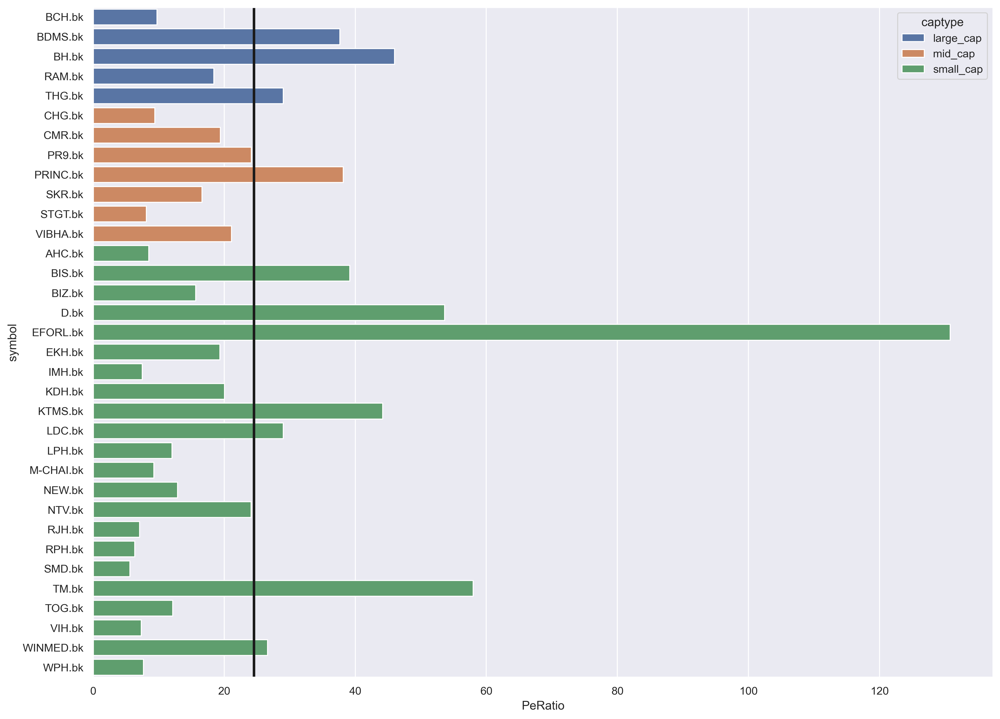

In [15]:
data1 = data_vm.loc[data_vm['asOfDate']==datetime.date(2022, 12, 31)]
data1 = data1[['symbol','PeRatio']]
data1 = pd.merge(data1,data_Cat[['symbol','captype']],how='left',on='symbol')
data1 = data1.sort_values(['captype','symbol'])

sns.set(rc={'figure.figsize':(16,12), 'figure.dpi':300}) #rc={'figure.dpi':300}
g = sns.barplot(data = data1, x='PeRatio',  y='symbol', orient='h',hue='captype',dodge=False)
g.axvline(data1.PeRatio.mean(), c='k', ls='-', lw=2.5)
plt.show()

In [16]:
data1 = data_vm.loc[data_vm['asOfDate']==datetime.date(2022, 12, 31)]

In [17]:
data2 = data_vm.loc[(data_vm['asOfDate']==datetime.date(2022, 12, 31)) | (data_vm['asOfDate']==datetime.date(2021, 12, 31))]
data2 = data2[['symbol','PeRatio','asOfDate']]

data2 = pd.merge(data2,data_Cat[['symbol','marketCap']],how='left',on='symbol')
data2 = data2.sort_values(['marketCap','symbol','asOfDate'],ascending = [False,True,True])

In [18]:
piv_pe = pd.pivot_table(data2, values="PeRatio",index=["symbol"], columns=["asOfDate"]).reset_index()
piv_pe.head()

asOfDate,symbol,2021-12-31,2022-12-31
0,AHC.bk,12.290076,8.492462
1,BCH.bk,10.806452,9.740000
2,BDMS.bk,47.916667,37.662338
3,BH.bk,156.666667,45.986985
4,BIS.bk,NaN,39.153689


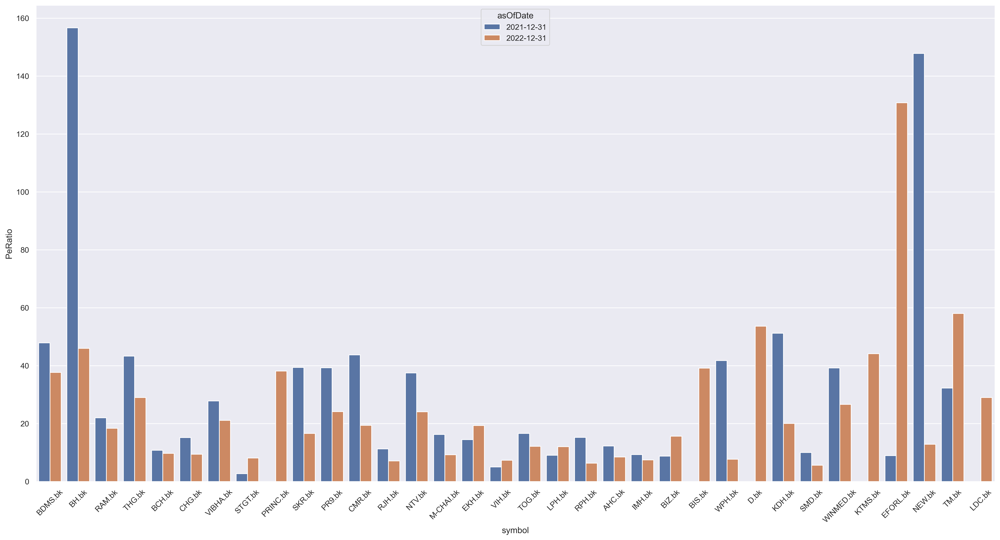

In [19]:
sns.set(rc={'figure.figsize':(24,12), 'figure.dpi':300})
g = sns.barplot(data=data2, x="symbol", y="PeRatio", hue="asOfDate")
plt.xticks(rotation=45)
plt.show()

In [20]:
piv_pe['pct_change'] = (piv_pe.iloc[:,2]/piv_pe.iloc[:,1])-1
piv_pe.head()

asOfDate,symbol,2021-12-31,2022-12-31,pct_change
0,AHC.bk,12.290076,8.492462,-0.308998
1,BCH.bk,10.806452,9.740000,-0.098687
2,BDMS.bk,47.916667,37.662338,-0.214003
3,BH.bk,156.666667,45.986985,-0.706466
4,BIS.bk,NaN,39.153689,NaN


In [21]:
data3 = piv_pe[['symbol','pct_change']]
data3 = pd.merge(data3,data_Cat[['symbol','marketCap','captype']],how='left',on='symbol')
data3 = data3.sort_values(['marketCap','symbol'],ascending = [False,True])


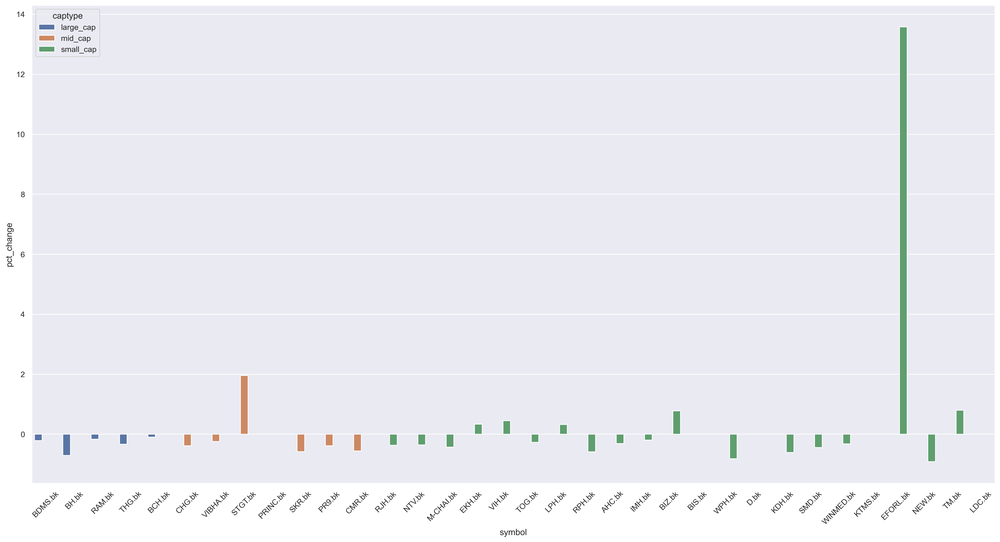

In [22]:
sns.set(rc={'figure.figsize':(24,12), 'figure.dpi':300})
g = sns.barplot(data=data3, x="symbol", y="pct_change", hue='captype')
plt.xticks(rotation=45)
plt.show()


In [23]:
data4 = pd.merge(data_vm,data_Cat[['symbol','captype']],how='left',on='symbol') 
data4 = data4.groupby(['captype', 'asOfDate'])['MarketCap'].sum().reset_index()
data4.head()

,captype,asOfDate,MarketCap
0,large_cap,2021-12-31,6.068284e+11
1,large_cap,2022-03-31,6.940277e+11
2,large_cap,2022-06-30,6.989416e+11
3,large_cap,2022-09-30,8.136198e+11
4,large_cap,2022-12-31,8.030572e+11


In [24]:
tmp_forMerge = pd.DataFrame()
for i in data4['captype'].unique():
    tmp = data4.loc[data4['captype']==i]
    tmp = tmp.sort_values('asOfDate').reset_index(drop=1)
    tmp['pct_change'] = tmp['MarketCap'].pct_change()
    tmp_forMerge = pd.concat([tmp_forMerge,tmp])
    
data4 = pd.merge(data4,tmp_forMerge,on=['captype','asOfDate'], how='left')
data4.head()

,captype,asOfDate,MarketCap_x,MarketCap_y,pct_change
0,large_cap,2021-12-31,6.068284e+11,6.068284e+11,NaN
1,large_cap,2022-03-31,6.940277e+11,6.940277e+11,0.143697
2,large_cap,2022-06-30,6.989416e+11,6.989416e+11,0.007080
3,large_cap,2022-09-30,8.136198e+11,8.136198e+11,0.164074
4,large_cap,2022-12-31,8.030572e+11,8.030572e+11,-0.012982


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


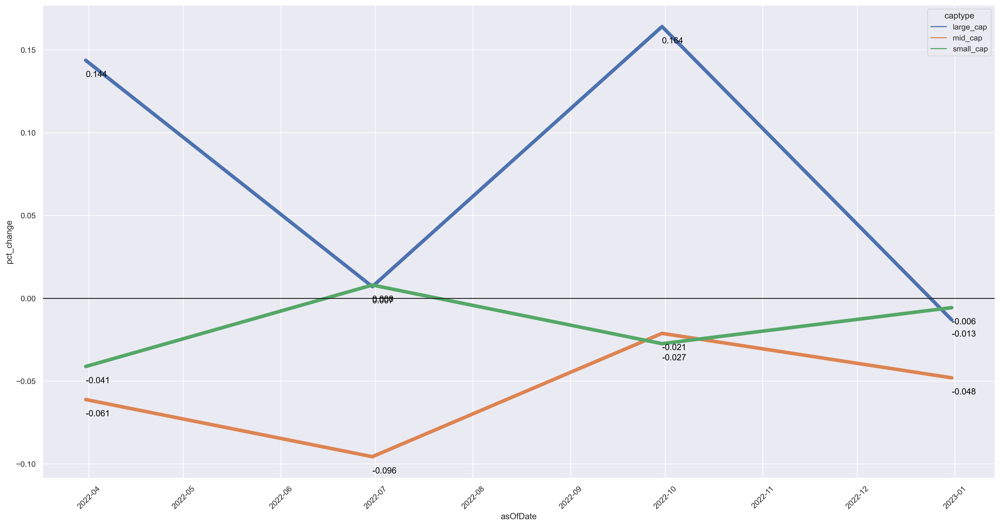

In [25]:
sns.set(rc={'figure.figsize':(24,12), 'figure.dpi':300})
g = sns.lineplot(data=data4, x="asOfDate", y="pct_change", hue='captype',lw=5)
g.axhline(0, c='k', ls='-', lw=1.2)
plt.xticks(rotation=45)

for x, y in zip(data4['asOfDate'], data4['pct_change']):
     plt.text(x = x,
              y = y-0.01,
              s = '{:.3f}'.format(y),
              color = 'black')

plt.show()

In [26]:
data5 = pd.merge(data_vm,data_Cat[['symbol','industry']],how='left',on='symbol') 
data5 = data5.groupby(['industry', 'asOfDate'])['MarketCap'].sum().reset_index()

tmp_forMerge = pd.DataFrame()
for i in data5['industry'].unique():
    tmp = data5.loc[data5['industry']==i]
    tmp = tmp.sort_values('asOfDate').reset_index(drop=1)
    tmp['pct_change'] = tmp['MarketCap'].pct_change()
    tmp_forMerge = pd.concat([tmp_forMerge,tmp])
    
data5 = pd.merge(data5,tmp_forMerge,on=['industry','asOfDate'], how='left')
data5.head()

,industry,asOfDate,MarketCap_x,MarketCap_y,pct_change
0,Medical Care Facilities,2021-12-31,7.985479e+11,7.985479e+11,NaN
1,Medical Care Facilities,2022-03-31,8.862598e+11,8.862598e+11,0.109839
2,Medical Care Facilities,2022-06-30,8.999297e+11,8.999297e+11,0.015424
3,Medical Care Facilities,2022-09-30,1.022430e+12,1.022430e+12,0.136122
4,Medical Care Facilities,2022-12-31,1.007920e+12,1.007920e+12,-0.014191


posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


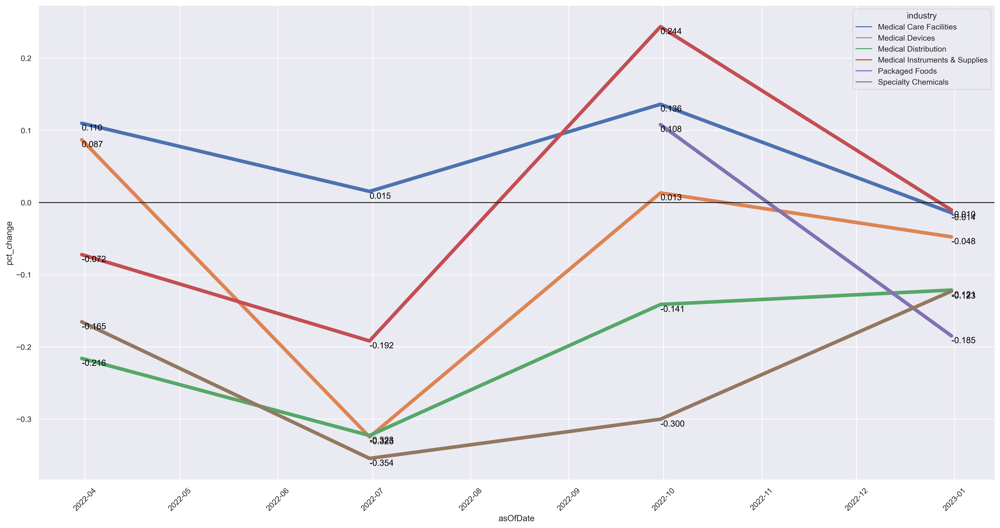

In [27]:
sns.set(rc={'figure.figsize':(24,12), 'figure.dpi':300})
g = sns.lineplot(data=data5, x="asOfDate", y="pct_change", hue='industry',lw=5)
g.axhline(0, c='k', ls='-', lw=1.2)
plt.xticks(rotation=45)

for x, y in zip(data5['asOfDate'], data5['pct_change']):
     plt.text(x = x,
              y = y-0.01,
              s = '{:.3f}'.format(y),
              color = 'black')

plt.show()

In [28]:
#สนใจ large_cap

In [29]:
dataSelect = data_price.loc[data_price['symbol'].isin( data_Cat.loc[data_Cat['captype']=='large_cap']['symbol'])]
tmp_forMerge = pd.DataFrame()
for i in dataSelect['symbol'].unique():
    tmp = dataSelect.loc[dataSelect['symbol']==i]
    tmp = tmp.sort_values('date').reset_index(drop=1)
    tmp['pct_change'] = tmp['close'].pct_change()
    tmp_forMerge = pd.concat([tmp_forMerge,tmp])
    
dataSelect = tmp_forMerge.copy().reset_index(drop=1)
dataSelect.head()

,symbol,date,open,high,low,close,volume,adjclose,dividends,splits,pct_change
0,BDMS.bk,2017-01-04,23.200001,23.400000,22.900000,23.299999,29363700,20.498096,0.0,0.0,NaN
1,BDMS.bk,2017-01-05,23.299999,23.299999,22.799999,23.000000,24443000,20.234171,0.0,0.0,-0.012876
2,BDMS.bk,2017-01-06,23.000000,23.100000,22.700001,22.700001,29606000,19.970251,0.0,0.0,-0.013043
3,BDMS.bk,2017-01-09,22.799999,22.799999,22.400000,22.700001,21020400,19.970251,0.0,0.0,0.000000
4,BDMS.bk,2017-01-10,22.600000,22.700001,22.400000,22.500000,18681200,19.794298,0.0,0.0,-0.008811


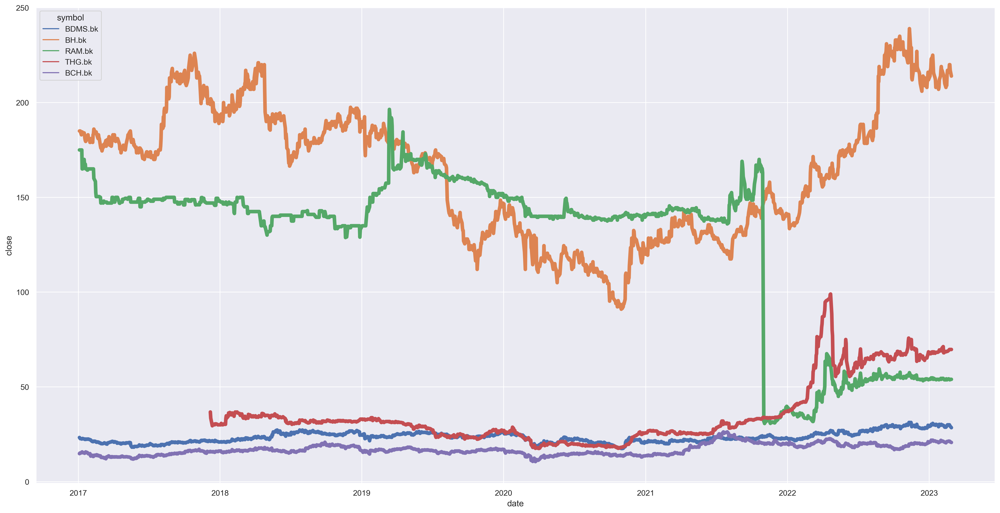

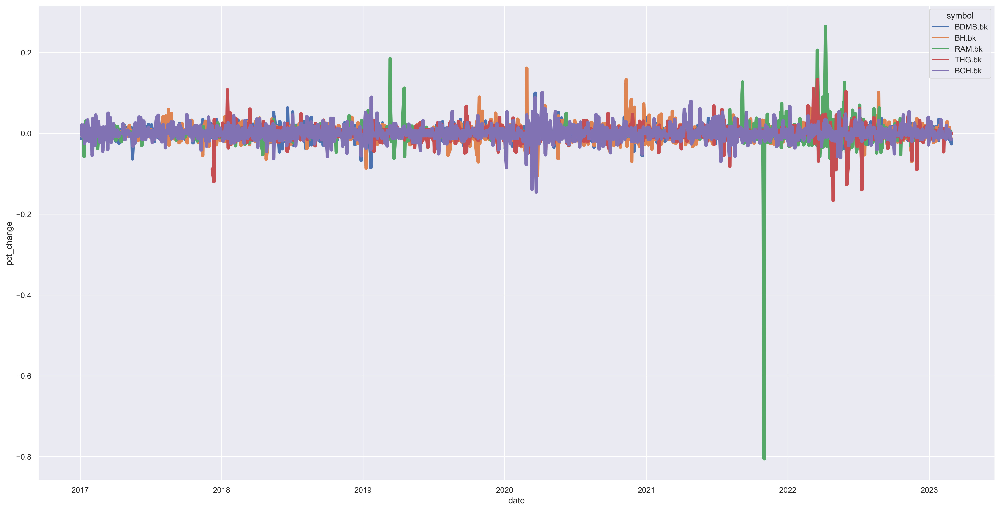

In [30]:
sns.set(rc={'figure.figsize':(24,12), 'figure.dpi':300})
g = sns.lineplot(data=dataSelect, x="date", y="close", hue='symbol',lw=5)
plt.show()

sns.set(rc={'figure.figsize':(24,12), 'figure.dpi':300})
g = sns.lineplot(data=dataSelect, x="date", y="pct_change", hue='symbol',lw=5)
plt.show()

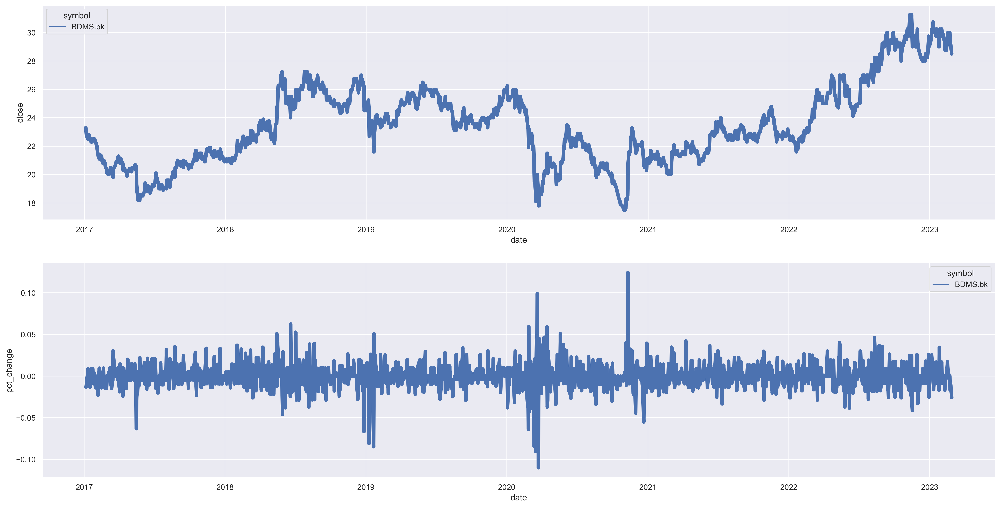

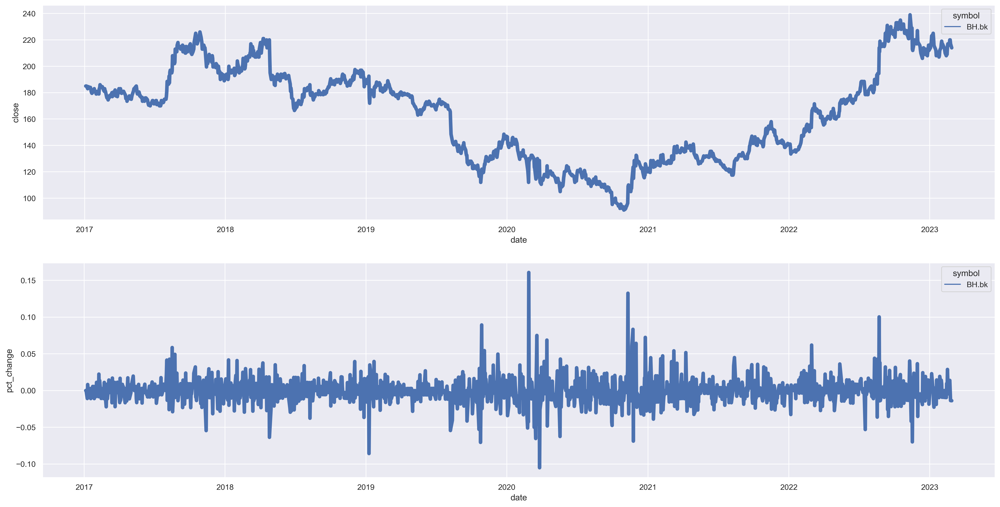

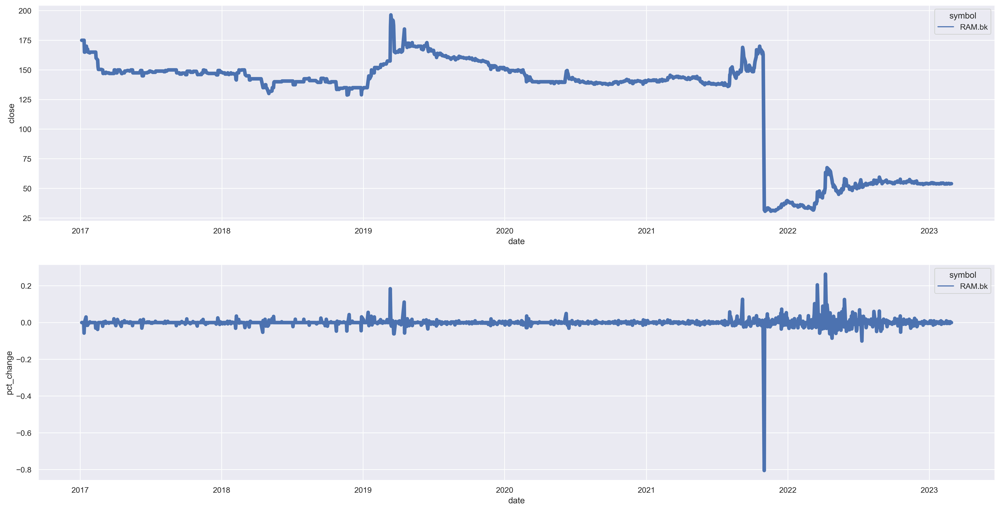

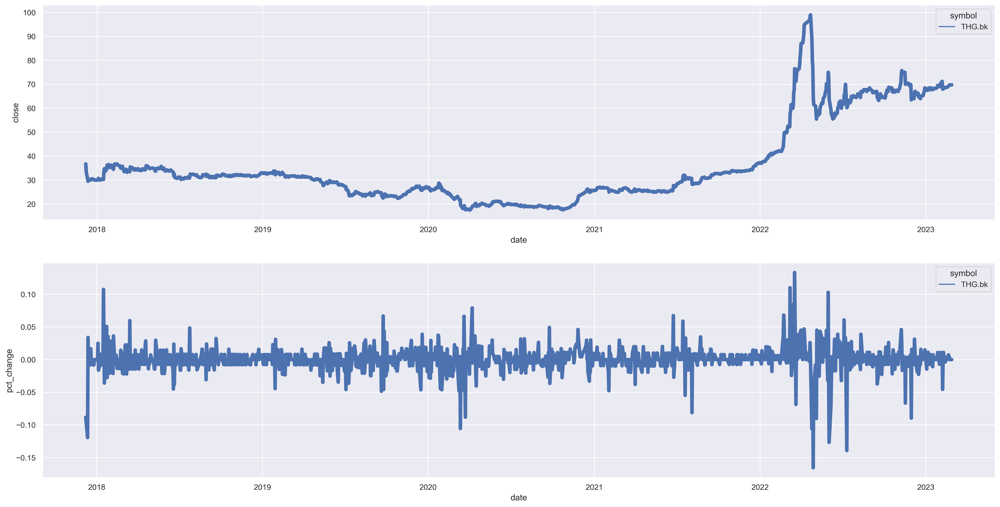

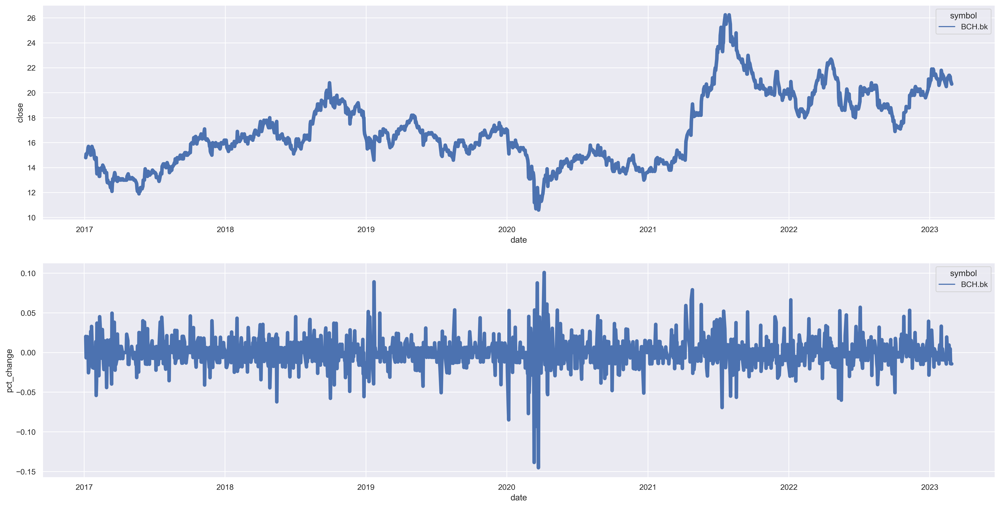

In [31]:
for idx, i in enumerate (dataSelect['symbol'].unique()):
    tmp_ = dataSelect.loc[dataSelect['symbol']==i].reset_index(drop=1)
    fig, axes = plt.subplots(2, 1)
    sns.set(rc={'figure.figsize':(24,12), 'figure.dpi':300})

    sns.lineplot(data=tmp_, x="date", y="close", hue='symbol',lw=5, ax=axes[0])
    sns.lineplot(data=tmp_, x="date", y="pct_change", hue='symbol',lw=5, ax=axes[1])
    plt.show()

In [32]:
dataSelect2 = data_price.loc[(data_price['symbol'].isin( data_Cat.loc[data_Cat['captype']=='large_cap']['symbol'])) & 
                            (pd.to_datetime(data_price['date']).dt.date >= datetime.date(2022,1,1)) & (pd.to_datetime(data_price['date']).dt.date <= datetime.date(2022,12,31))]
dataSelect2.head()

,symbol,date,open,high,low,close,volume,adjclose,dividends,splits
1215,BDMS.bk,2022-01-04,23.000000,23.100000,22.299999,22.400000,72220800,21.761398,0.0,0.0
1216,BDMS.bk,2022-01-05,22.400000,22.700001,22.299999,22.700001,27046600,22.052845,0.0,0.0
1217,BDMS.bk,2022-01-06,22.700001,22.799999,22.299999,22.400000,38953600,21.761398,0.0,0.0
1218,BDMS.bk,2022-01-07,22.600000,22.799999,22.500000,22.600000,25742700,21.955694,0.0,0.0
1219,BDMS.bk,2022-01-10,22.600000,22.799999,22.500000,22.700001,9308500,22.052845,0.0,0.0


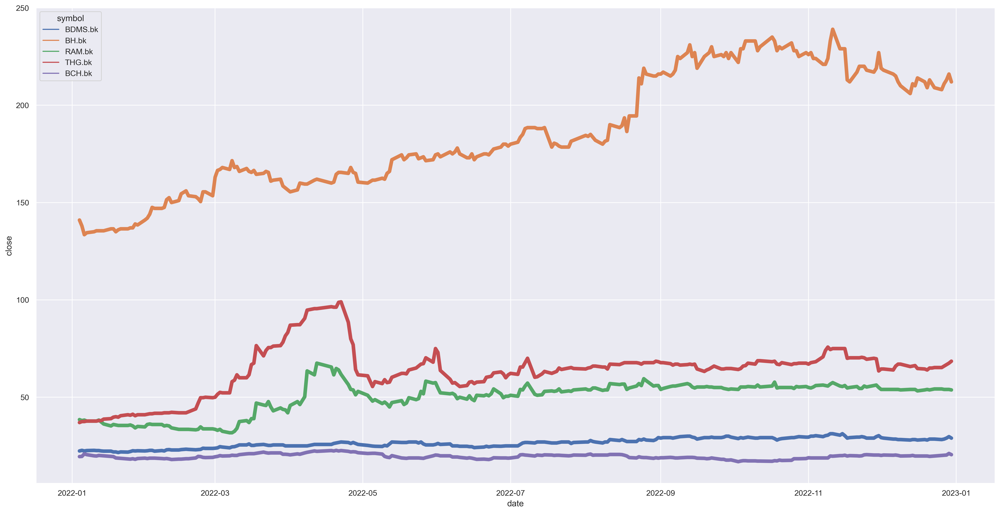

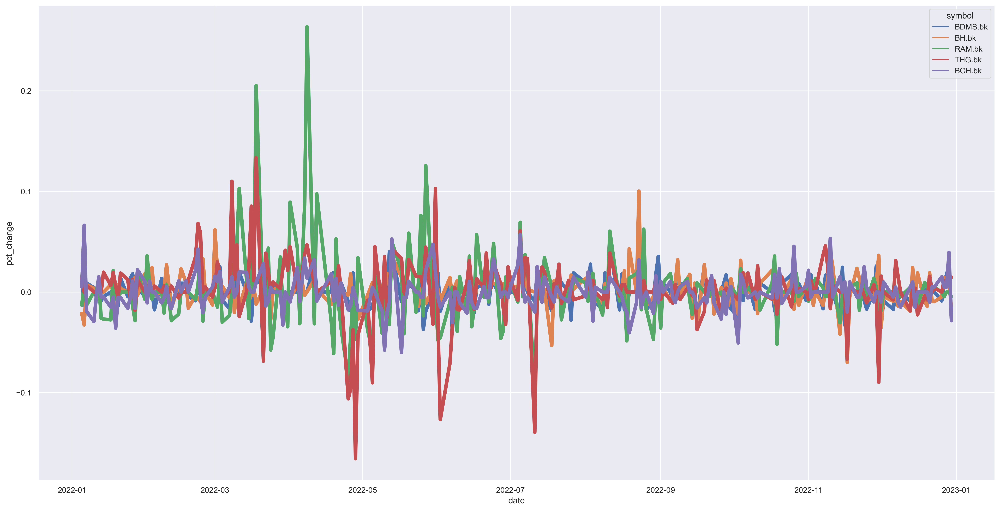

In [33]:
tmp_forMerge = pd.DataFrame()
for i in dataSelect2['symbol'].unique():
    tmp = dataSelect2.loc[dataSelect2['symbol']==i]
    tmp = tmp.sort_values('date').reset_index(drop=1)
    tmp['pct_change'] = tmp['close'].pct_change()
    tmp_forMerge = pd.concat([tmp_forMerge,tmp])
    
dataSelect2 = tmp_forMerge.copy().reset_index(drop=1)
    
sns.set(rc={'figure.figsize':(24,12), 'figure.dpi':300})
g = sns.lineplot(data=dataSelect2, x="date", y="close", hue='symbol',lw=5)
plt.show()

sns.set(rc={'figure.figsize':(24,12), 'figure.dpi':300})
g = sns.lineplot(data=dataSelect2, x="date", y="pct_change", hue='symbol',lw=5)
plt.show()

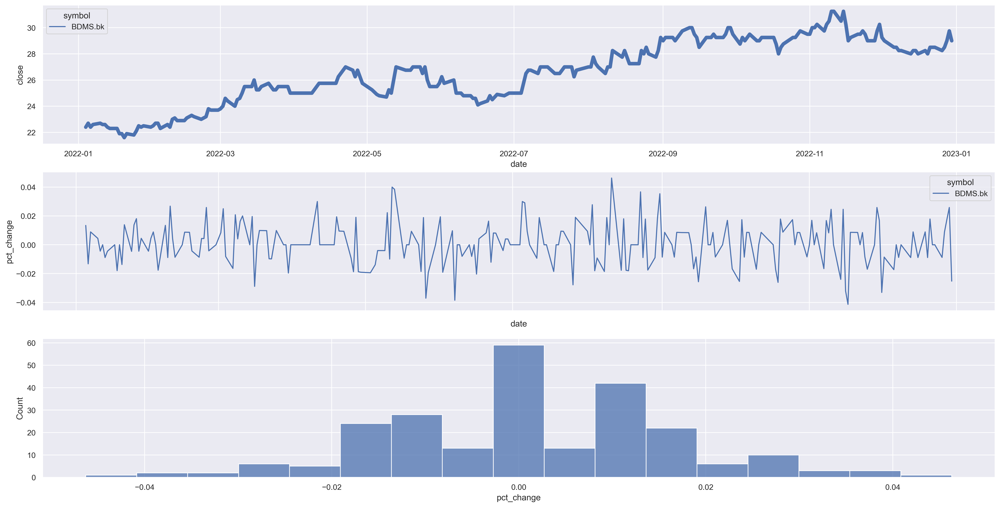

sum pct_change BDMS.bk 0.28449310766134783


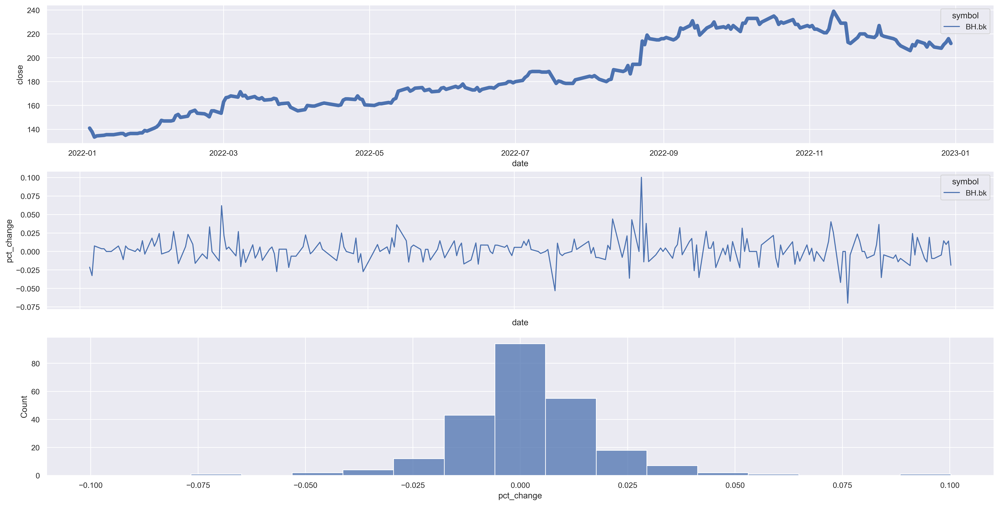

sum pct_change BH.bk 0.4424916844007837


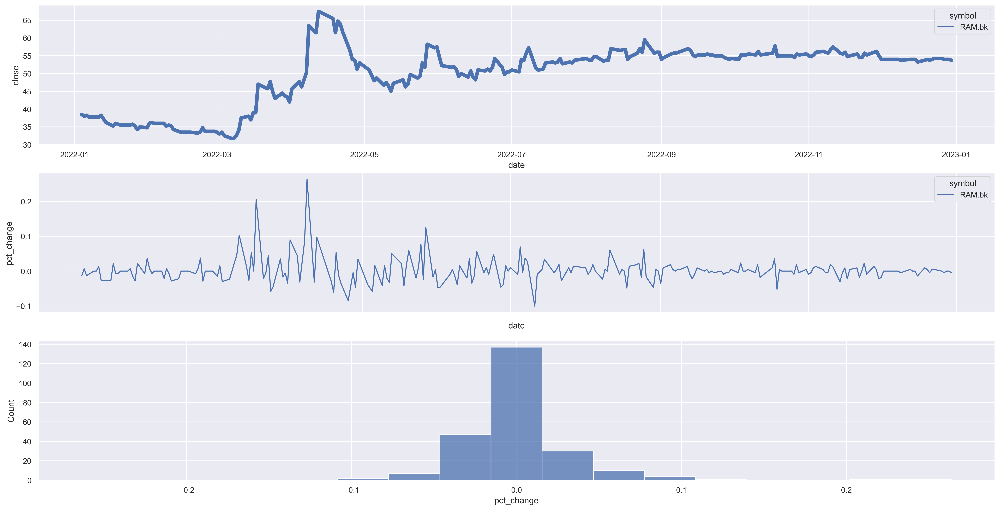

sum pct_change RAM.bk 0.4797177308278193


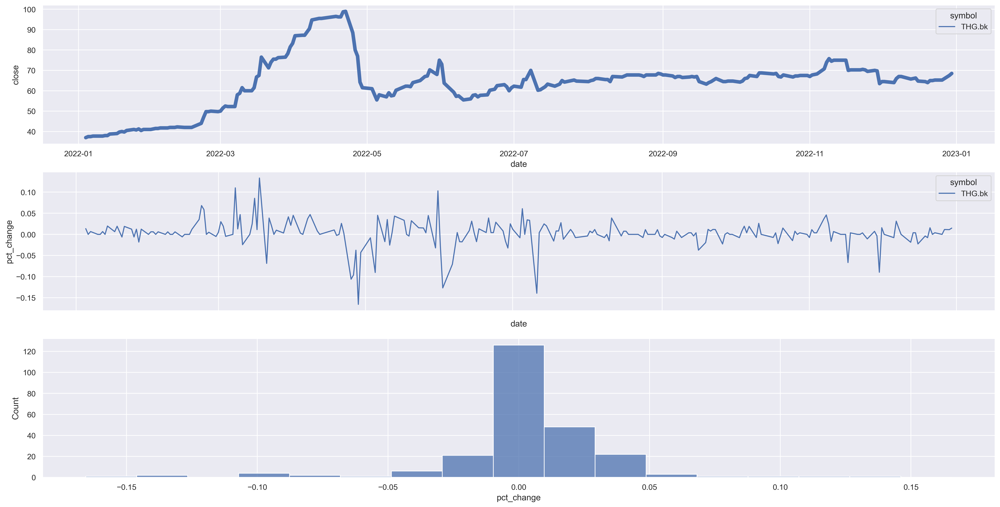

sum pct_change THG.bk 0.7380067604070968


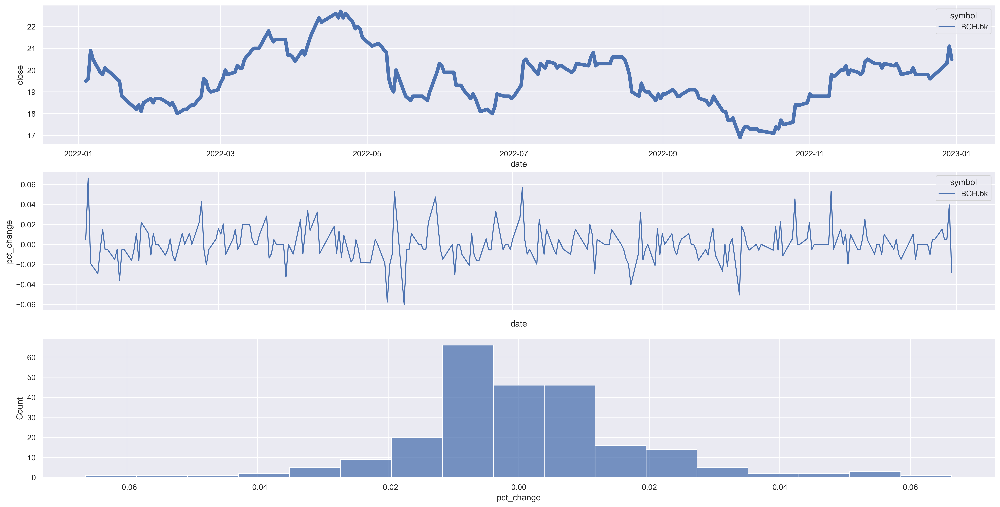

sum pct_change BCH.bk 0.08468904054714066


In [34]:
df_return = pd.DataFrame()
for idx, i in enumerate (dataSelect2['symbol'].unique()):
    tmp_ = dataSelect2.loc[dataSelect2['symbol']==i].reset_index(drop=1)
    fig, axes = plt.subplots(3)
    sns.set(rc={'figure.figsize':(24,12), 'figure.dpi':300})
    sns.lineplot(data=tmp_, x="date", y="close", hue='symbol',lw=5, ax=axes[0])
    sns.lineplot(data=tmp_, x="date", y="pct_change", hue='symbol', ax=axes[1]).set(xticklabels=[])
    
    min_val = tmp_['pct_change'].min()
    max_val = tmp_['pct_change'].max()
    
    abs_max = abs(max_val) if abs(max_val) > abs(min_val) else abs(min_val)
    val_width = max_val - min_val
    n_bins = 17
    bin_width = val_width/n_bins


    sns.histplot(data=tmp_, x="pct_change", ax=axes[2],bins=n_bins, binrange=(-abs_max, abs_max))
    plt.show()
    df_return = pd.concat([df_return,pd.DataFrame({'symbol':[i],'return':[tmp_['pct_change'].sum()]})])
    print ('sum pct_change', i, tmp_['pct_change'].sum())

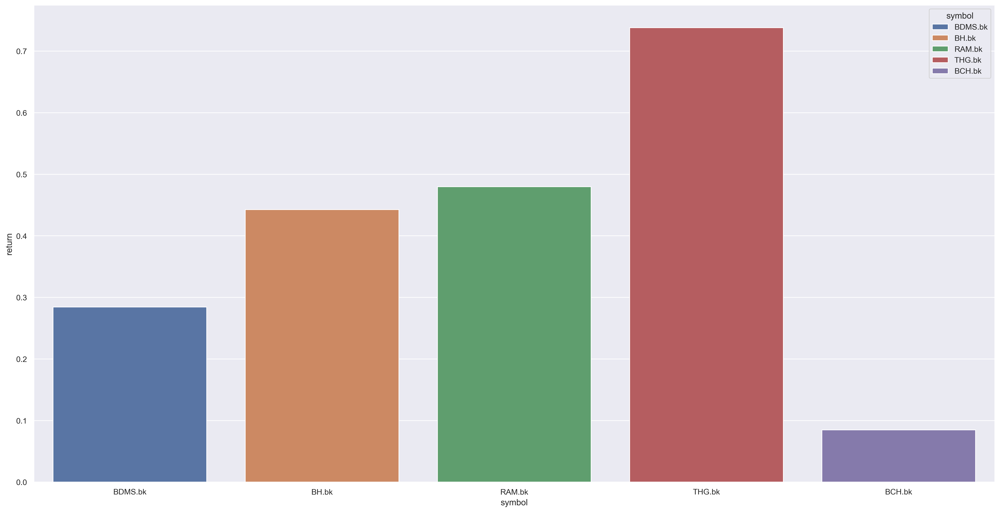

In [35]:
sns.set(rc={'figure.figsize':(24,12), 'figure.dpi':300})
g = sns.barplot(data=df_return, x="symbol", y="return", hue='symbol',dodge=False)
plt.show()